In [ ]:
!mkdir ~/.kaggle
! mv kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [2]:
!kaggle datasets download greg115/celebrities-100k

 99% 808M/820M [00:07<00:00, 138MB/s]
100% 820M/820M [00:07<00:00, 113MB/s]


In [ ]:
!unzip celebrities-100k.zip
!unzip 100k.zip

In [49]:
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.utils as utils
from IPython.display import HTML


seed = 100
random.seed(seed)
torch.manual_seed(seed)

## Visualize data

There are total 100000 images in the folder


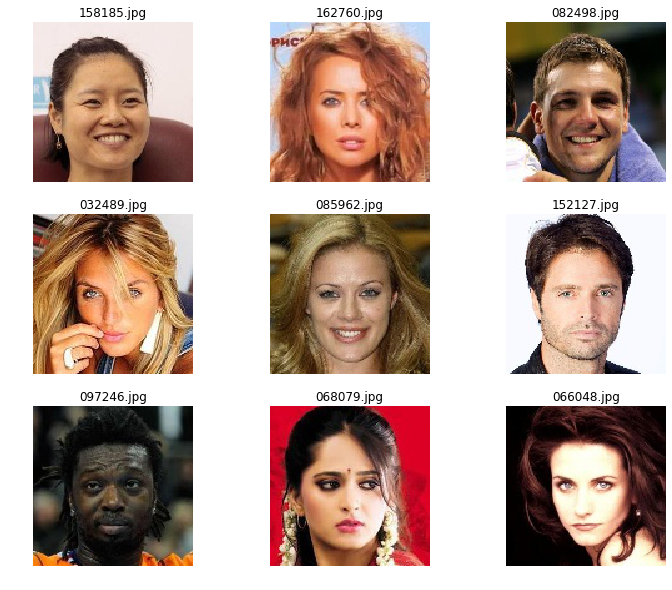

In [6]:
images = os.listdir('./100k')
print('There are total {} images in the folder'.format(len(images)))

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for index, axis in enumerate(axes.flatten()):
  rand_index = np.random.randint(0, len(images))
  img = plt.imread('./100k/'+images[rand_index])
  imgplot = axis.imshow(img)
  axis.set_title(images[rand_index])
  axis.set_axis_off()


Print shape of the images

In [7]:
img = plt.imread('./100k/'+images[0])
print(img.shape)

(128, 128, 3)


In [ ]:
!mkdir dataset
! mv 100k ./dataset/100k

In [ ]:
workers = 2
batch_size = 128
image_size = 64
nchannels = 3
nz = 100 # size of latent vectors
ngf = 64 # feature maps in generator
ndf = 64 # feature maps in discriminator
num_epochs = 10
lr = 0.0002
beta = 0.5

transform = transforms.Compose([
                              transforms.Resize(image_size),
                              transforms.CenterCrop(image_size),
                              transforms.ToTensor(),
                              transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('./dataset/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                        batch_size=batch_size, num_workers=workers)
device = torch.device('cuda:0')

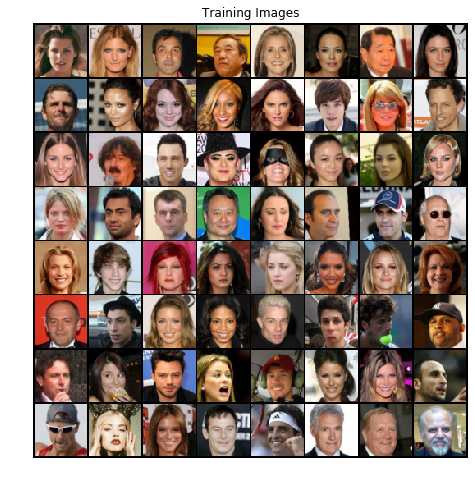

In [31]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data,0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data,1.0, 0.02)
    nn.init.constant_(m.bias.data,0)

In [ ]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()
    
    self.main = nn.Sequential(nn.ConvTranspose2d(nz, ngf*8, 4, stride=1, padding=0, bias=False),
                              nn.BatchNorm2d(ngf*8),
                              nn.ReLU(True),
                              nn.ConvTranspose2d(ngf*8, ngf*4, 4, stride=2, padding=1, bias=False),
                              nn.BatchNorm2d(ngf*4),
                              nn.ReLU(True),
                              nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False),
                              nn.BatchNorm2d(ngf*2),
                              nn.ReLU(True),
                              nn.ConvTranspose2d(ngf*2, ngf, 4, stride=2, padding=1, bias=False),
                              nn.BatchNorm2d(ngf),
                              nn.ReLU(True),
                              nn.ConvTranspose2d(ngf, nchannels, 4, stride=2, padding=1, bias=False),
                              nn.Tanh())
    
  def forward(self, input):
    output = self.main(input)
    return output

In [58]:
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [59]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential(
                nn.Conv2d(nchannels, ndf, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                
                nn.Conv2d(ndf, ndf*2, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(ndf*2),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                
                nn.Conv2d(ndf*2, ndf*4, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(ndf*4),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                
                nn.Conv2d(ndf*4, ndf*8, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(ndf*8),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                
                nn.Conv2d(ndf*8, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
    
  def forward(self, input):
    return self.main(input)
  
  
netD = Discriminator().to(device)
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [ ]:
criterion = nn.BCELoss()
real_label = 1
fake_label = 0
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta,0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta,0.999))

In [61]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting training loop...")
for epoch in range(num_epochs):
  for i, data in enumerate(dataloader, 0):
    
    netD.zero_grad()
    real = data[0].to(device)
    b_size = real.size(0)
    label = torch.full((b_size,), real_label,device=device)
    output = netD(real).view(-1)
    errD_real = criterion(output, label)
    errD_real.backward()
    D_x = output.mean().item()
    
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    fake = netG(noise)
    label.fill_(fake_label)
    output = netD(fake.detach()).view(-1)
    errD_fake = criterion(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    
    errD = errD_real + errD_fake
    optimizerD.step()
    
    netG.zero_grad()
    label.fill_(real_label)
    output = netD(fake).view(-1)
    errG = criterion(output, label)
    errG.backward()
    D_G_z2 = output.mean().item()
    optimizerG.step()
    
    
    if i % 50 == 0:
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
    G_losses.append(errG.item())
    D_losses.append(errD.item())
    
    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        img_list.append(utils.make_grid(fake, padding=2, normalize=True))

    iters += 1

Starting training loop...
[0/10][0/782] Loss_D: 1.9173; Loss_G: 4.6859	D(x): 0.4879	D(G(z)): 0.5955 / 0.0147
[0/10][50/782] Loss_D: 1.9013; Loss_G: 29.5348	D(x): 0.4034	D(G(z)): 0.0000 / 0.0000
[0/10][100/782] Loss_D: 0.2918; Loss_G: 6.6803	D(x): 0.8892	D(G(z)): 0.0647 / 0.0028
[0/10][150/782] Loss_D: 0.7995; Loss_G: 6.8356	D(x): 0.8081	D(G(z)): 0.3777 / 0.0031
[0/10][200/782] Loss_D: 1.3232; Loss_G: 11.5100	D(x): 0.9791	D(G(z)): 0.6747 / 0.0000
[0/10][250/782] Loss_D: 0.3721; Loss_G: 4.2266	D(x): 0.7953	D(G(z)): 0.0563 / 0.0226
[0/10][300/782] Loss_D: 0.5750; Loss_G: 2.8369	D(x): 0.7547	D(G(z)): 0.1748 / 0.0903
[0/10][350/782] Loss_D: 0.3812; Loss_G: 3.3379	D(x): 0.8537	D(G(z)): 0.1622 / 0.0548
[0/10][400/782] Loss_D: 1.1455; Loss_G: 2.4949	D(x): 0.4382	D(G(z)): 0.0092 / 0.1714
[0/10][450/782] Loss_D: 1.4947; Loss_G: 2.1205	D(x): 0.4019	D(G(z)): 0.0143 / 0.2547
[0/10][500/782] Loss_D: 0.6345; Loss_G: 5.5932	D(x): 0.8950	D(G(z)): 0.3305 / 0.0091
[0/10][550/782] Loss_D: 1.0355; Loss_G: 

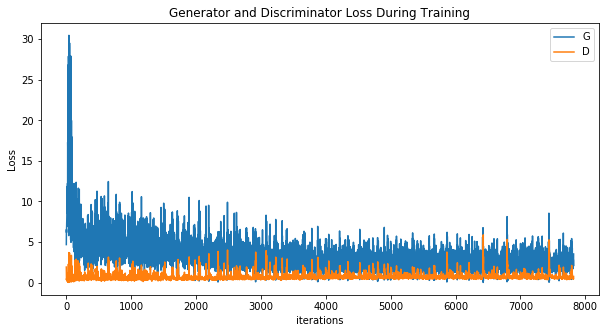

In [62]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

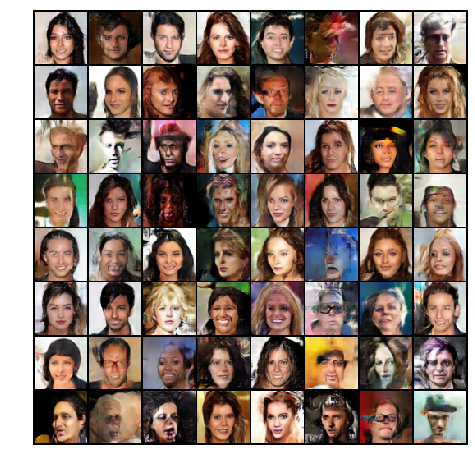

In [75]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=0, blit=True)
HTML(ani.to_jshtml())

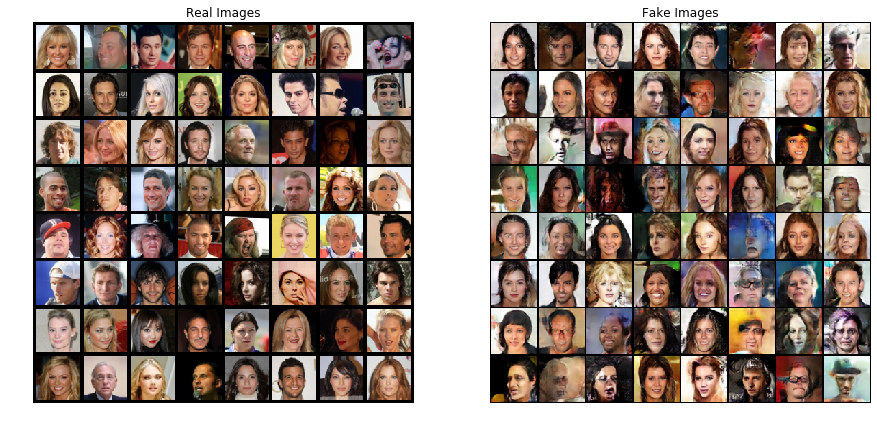

In [64]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(utils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()